In [5]:
import csv
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from scipy.signal import find_peaks
import scipy.signal as sig
import pandas as pd
import matplotlib as mpl

folder = '../BioTac_slide_20_50/raw_data/' 
sampling = 100

In [2]:
def generate_one_freq(freq,time,rate,pw):
    period=1/freq
    spiketimes = np.arange(0,time,period)[1:] #we don't want the spike at 0
    risetimes = spiketimes-pw/2
    falltimes = spiketimes+pw/2
    times = np.linspace(0,time,int(time*rate))
    volts = np.logical_or.reduce([np.logical_and(times>risetimes[i],times<falltimes[i])for i in range(len(spiketimes))])
    return times, volts

def generate_multi_freq(freqs,time,rate,pw):
    times = np.linspace(0,time,int(time*rate))
    volts = np.zeros(len(times))
    for freq in freqs:
        loctimes,locvolts = generate_one_freq(freq,time,rate,pw)
        volts = np.logical_or(volts,locvolts)
    return times,volts

def slew(volts,rate,rt,ft):
    #use np diff to find edges
    #tiems*rate -> no samples
    #linspace 0 to 1 no samples
    #loop through edges above and apply the linspace vals
    rcount = rt*rate
    fcount = ft*rate
    if rcount < 1 or fcount < 1:
        raise ValueError('ft or rt smaller than 1 sample, cant slew')
    else:
        rcount = int(rcount)
        fcount = int(fcount)

    rslew = np.linspace(0,1,rcount+1)
    fslew = np.linspace(1,0,fcount+1)
    
    diff = np.diff(volts.astype(np.int16))
    rising = np.array(np.where(diff==1))[0]+1
    falling = np.array(np.where(diff==-1))[0]+1
    voltsout = np.copy(volts).astype(float)
    for rise in rising:
        voltsout[rise-1:rise+rcount]=rslew
    for fall in falling:
        voltsout[fall-fcount:fall+1]=fslew
    
    return rising, falling, voltsout

def generate_multi_isis(freqs,time):
    spiketimes = np.array([])
    for freq in freqs:
        period = 1/freq
        spiketimes_loc = np.arange(0,time,period)[1:]
        spiketimes = np.hstack((spiketimes,spiketimes_loc))
    spiketimes = np.sort(spiketimes)
    isis = np.diff(spiketimes)
    isi_nonzero = isis[isis>=10**(-12)]
    return isi_nonzero

def compress(times, volts):
    diff = np.diff(volts)
    diffmin = np.append(diff,1)
    diffplus = np.insert(diff,0,1)
    cut = np.ones(len(slewed),dtype=bool)
    cut = np.logical_or(diffmin!=0,diffplus!=0)
    return times[cut],volts[cut]

def timestotrain(spiketimes,time,rate,pw):
    risetimes = spiketimes-pw/2
    falltimes = spiketimes+pw/2
    times = np.linspace(0,time,int(time*rate))
    volts = np.logical_or.reduce([np.logical_and(times>risetimes[i],times<falltimes[i])for i in range(len(spiketimes))])
    return times, volts

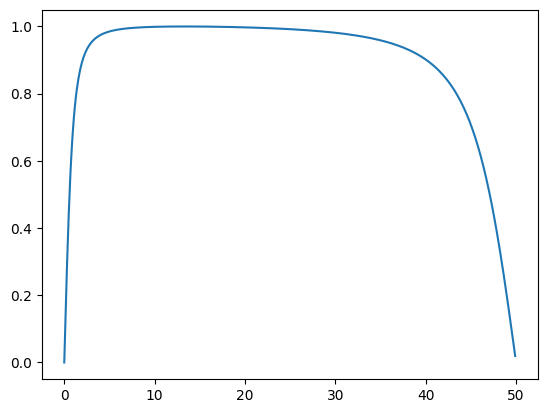

In [3]:
#b,a = sig.butter(4,1000,'low', fs = sampling)
b,a = sig.iirfilter(1, [1,45], btype='band', analog=False,ftype='butter', fs = sampling)
freqplotter = lambda w, h: plt.plot(w, abs(h))
w, h = sig.freqz(b, a,plot=freqplotter,fs=sampling)

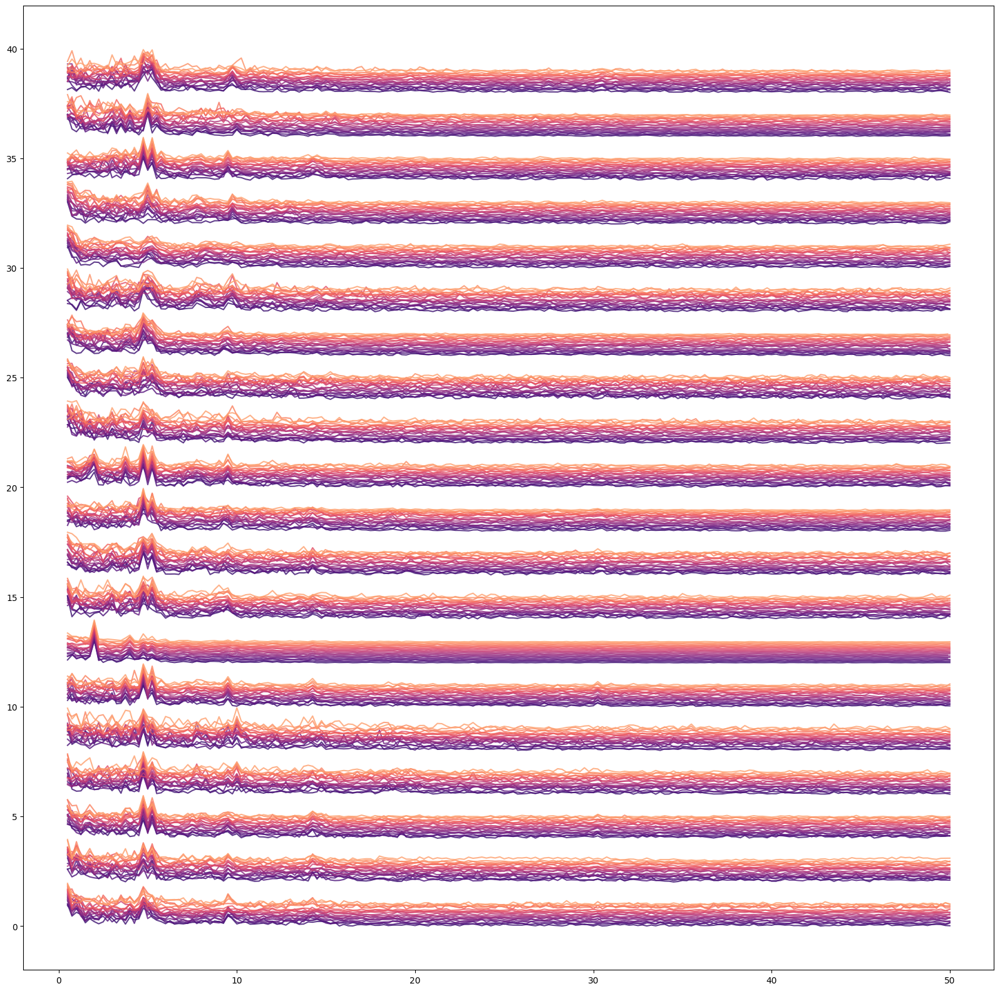

In [6]:
samplen = 400
plt.figure(figsize=(20,20))
colors = mpl.colormaps['magma'](np.linspace(0.2,0.8,20))
for i in range(20):
    for j in range(20):
        subfolder = f'mat{i+1}/'
        file = f'mat{i+1}_{j+1}_bio.csv'
        data = pd.read_csv(folder+subfolder+file)
        datatest = data['ele5'].to_numpy()
        sampmin = int((len(datatest)-samplen)/2)
        sampmax = int(len(datatest)-sampmin)
        datatest = datatest[sampmin:sampmax]
        ffttest=np.fft.rfft(datatest,len(datatest))
        datafreqs = np.fft.rfftfreq(len(datatest),d=1/sampling)
        plt.plot(datafreqs[2:],np.abs(ffttest[2:])/np.abs(ffttest[2:]).max()+2*i+0.05*j,c=colors[j],alpha=0.8)

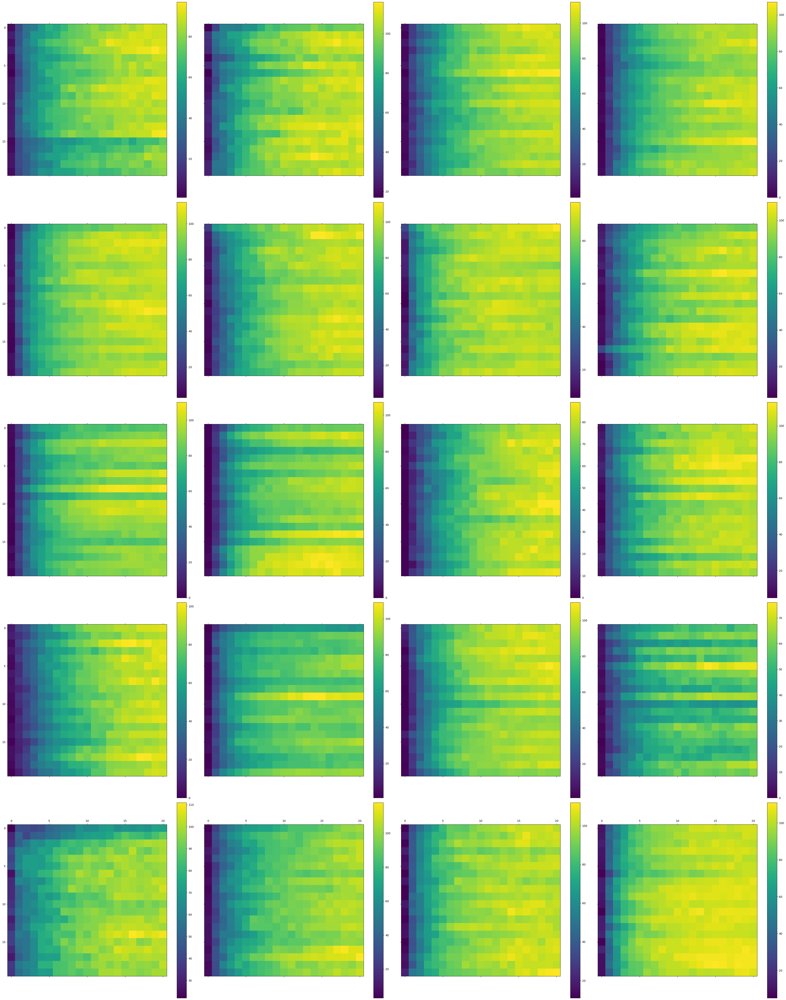

In [7]:
samplen = 400
time = samplen/sampling
rate = 1000
pw = 2*10**-2
rt = 0.5*10**-2
ft = 0.5*10**-2
cutoff = 50
prom = 50
distance_spikes = 2*10**-2
colors = mpl.colormaps['magma'](np.linspace(0.2,0.8,20))
fix,axs =plt.subplots(5,4,figsize=(40,50),sharey=True,sharex=True)
for i in range(20):
    spikecounts = np.empty((20,21))
    for j in range(20):
        for k in range(21):
            subfolder = f'mat{i+1}/'
            file = f'mat{i+1}_{j+1}_bio.csv'
            data = pd.read_csv(folder+subfolder+file)
            dataset = f'pac{k+1}'
            datatest = data[dataset].to_numpy()-data['pdc'].to_numpy()
            sampmin = int((len(datatest)-samplen)/2)
            sampmax = int(len(datatest)-sampmin)
            datatest = datatest[sampmin:sampmax]
            #datatest = datatest - np.min(datatest)
    
    
            
            # b,a = sig.iirfilter(1, [1,45], btype='band', analog=False,ftype='butter', fs = sampling)
            # datafilt = sig.filtfilt(b,a,datatest)
            #peaks = np.argwhere(np.diff((datatest>cutoff).astype('int32'),prepend=0)==1)
            peaks, _ = find_peaks(datatest, prominence = prom, distance=int(distance_spikes*sampling))
            # peaks_inv = np.argwhere(np.diff((datafilt<-cutoff).astype('int32'),prepend=0)==1)
            # peaks = np.concatenate((peaks,peaks_inv))
            # plt.plot(datafilt+200*i+5*j,c=colors[j],alpha=0.8)
            # plt.scatter(peaks,datafilt[peaks]+200*i+5*j)
            spikecounts[j,k] = len(peaks)
    map = axs.flatten()[i].matshow(spikecounts)
    plt.colorbar(map,ax=axs.flatten()[i])
            




plt.tight_layout()
plt.show()

In [ ]:
samplen = 400
time = samplen/sampling
rate = 1000
pw = 2*10**-2
rt = 0.5*10**-2
ft = 0.5*10**-2
cutoff = 50
colors = mpl.colormaps['magma'](np.linspace(0.2,0.8,20))
plt.figure(figsize=(20,20))
for i in range(20):
    for j in range(20):
        subfolder = f'mat{i+1}/'
        file = f'mat{i+1}_{j+1}_bio.csv'
        data = pd.read_csv(folder+subfolder+file)
        datatest = data['pdc'].to_numpy()
        sampmin = int((len(datatest)-samplen)/2)
        sampmax = int(len(datatest)-sampmin)
        datatest = datatest[sampmin:sampmax]

        
        b,a = sig.iirfilter(1, [1,45], btype='band', analog=False,ftype='butter', fs = sampling)
        datafilt = sig.filtfilt(b,a,datatest)
        peaks = np.argwhere(np.diff((datafilt>cutoff).astype('int32'),prepend=0)==1)
        # peaks_inv = np.argwhere(np.diff((datafilt<-cutoff).astype('int32'),prepend=0)==1)
        # peaks = np.concatenate((peaks,peaks_inv))
        # plt.plot(datafilt+200*i+5*j,c=colors[j],alpha=0.8)
        # plt.scatter(peaks,datafilt[peaks]+200*i+5*j)

        times, spike_train = timestotrain(peaks/sampling,time,rate,pw)
        plt.plot(times,spike_train+2*i+0.05*j,c=colors[j],alpha=0.8)
        
        #ax2.plot(datafreqs[2:],np.abs(ffttest[2:])/np.abs(ffttest[2:]).max()+2*i+0.05*j,c=colors[j],alpha=0.8)
plt.tight_layout()
plt.show()

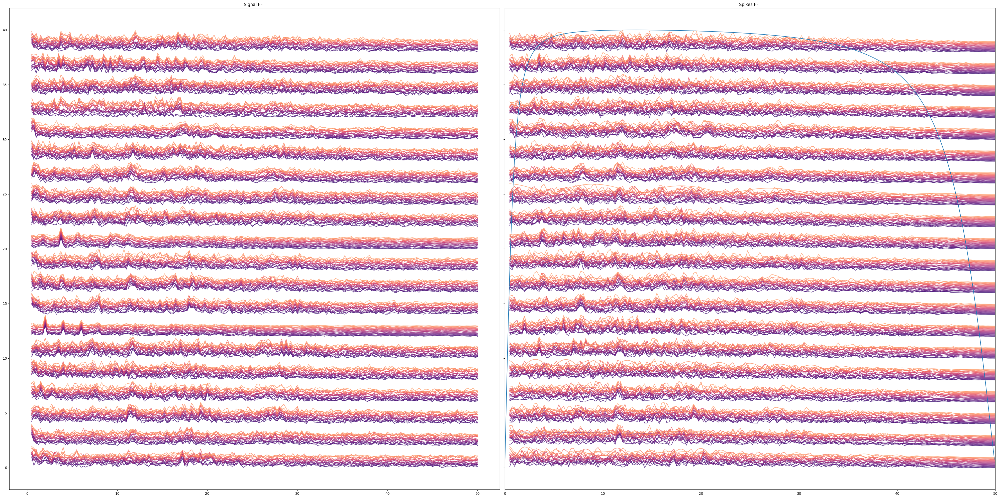

In [126]:
samplen = 400
time = samplen/sampling
rate = 1000
pw = 2*10**-2
prom = 0.5
colors = mpl.colormaps['magma'](np.linspace(0.2,0.8,20))
fix,(ax1,ax2)=plt.subplots(1,2,figsize=(40,20),sharey=True)
for i in range(20):
    for j in range(20):
        subfolder = f'mat{i+1}/'
        file = f'mat{i+1}_{j+1}_bio.csv'
        data = pd.read_csv(folder+subfolder+file)
        datatest = data['pdc'].to_numpy()
        sampmin = int((len(datatest)-samplen)/2)
        sampmax = int(len(datatest)-sampmin)
        datatest = datatest[sampmin:sampmax]

        ffttest=np.fft.rfft(datatest,len(datatest))
        datafreqs = np.fft.rfftfreq(len(datatest),d=1/sampling)
        ax1.plot(datafreqs[2:],np.abs(ffttest[2:])/np.abs(ffttest[2:]).max()+2*i+0.05*j,c=colors[j],alpha=0.8)

        
        b,a = sig.iirfilter(1, [1,45], btype='band', analog=False,ftype='butter', fs = sampling)
        datafilt = sig.filtfilt(b,a,datatest)
        datafilt -= np.min(datafilt)
        datafilt /= np.max(datafilt)
        peaks, _ = find_peaks(datafilt, prominence = prom, distance=int(distance_spikes*sampling))
        peaks_neg, _ = find_peaks(datafilt, prominence = prom, distance=int(distance_spikes*sampling))
        #peaks = np.append(peaks,peaks_neg)
        # plt.plot(datafilt+200*i+5*j,c=colors[j],alpha=0.8)
        # plt.scatter(peaks,datafilt[peaks]+200*i+5*j)

        times, spike_train = timestotrain(peaks/sampling,time,rate,pw)
        ffttest=np.fft.rfft(spike_train,len(spike_train))
        datafreqs = np.fft.rfftfreq(len(spike_train),d=1/rate)
        ax2.plot(datafreqs[2:],np.abs(ffttest[2:])/np.abs(ffttest[2:]).max()+2*i+0.05*j,c=colors[j],alpha=0.8)
ax2.set_xlim(0,50)

freqplotter = lambda w, h: ax2.plot(w, abs(h)*40)
w, h = sig.freqz(b, a,plot=freqplotter,fs=sampling)

ax1.set_title('Signal FFT')
ax2.set_title('Spikes FFT')
plt.tight_layout()
plt.show()

/tmp/ipykernel_54189/681533653.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('magma')(np.linspace(0.2,0.8,20))


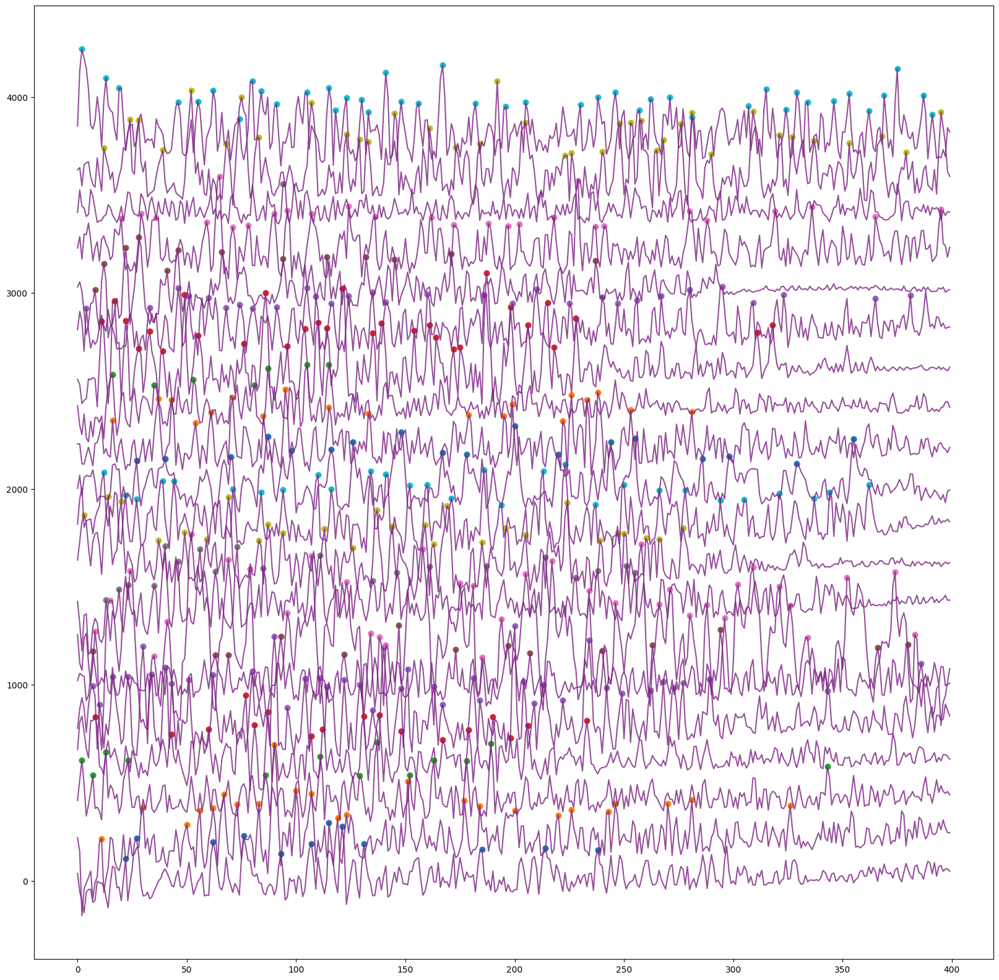

In [128]:
samplen = 400
time = samplen/sampling
rate = 100
pw = 10**-2
prom = 200
distance_spikes = 2*10**-2
plt.figure(figsize=(20,20))
colors = plt.cm.get_cmap('magma')(np.linspace(0.2,0.8,20))
for i in range(20):
    for j in [5]:
        subfolder = f'mat{i+1}/'
        file = f'mat{i+1}_{j+1}_bio.csv'
        data = pd.read_csv(folder+subfolder+file)
        datatest = data['pdc'].to_numpy()
        sampmin = int((len(datatest)-samplen)/2)
        sampmax = int(len(datatest)-sampmin)
        datatest = datatest[sampmin:sampmax]
        b,a = sig.iirfilter(1, [1,49], btype='band', analog=False,ftype='butter', fs = sampling)
        datafilt = sig.filtfilt(b,a,datatest)
        peaks, _ = find_peaks(datafilt, prominence = prom, distance=int(distance_spikes*sampling))
        peaks_neg, _ = find_peaks(datafilt, prominence = prom, distance=int(distance_spikes*sampling))
        peaks = np.append(peaks,peaks_neg)
        plt.plot(datafilt+200*i+5*j,c=colors[j],alpha=0.8)
        plt.scatter(peaks,datafilt[peaks]+200*i+5*j)

        # times, spike_train = timestotrain(peaks/sampling,time,rate,pw)
        # ffttest=np.fft.rfft(spike_train,len(spike_train))
        # datafreqs = np.fft.rfftfreq(len(spike_train),d=1/rate)
        # plt.plot(datafreqs[2:],np.abs(ffttest[2:])/np.abs(ffttest[2:]).max()+2*i+0.05*j,c=colors[j],alpha=0.8)